# Setup

In [1]:
suppressPackageStartupMessages({
    
    library(APL)
    # devtools::load_all("/home/kohl/PhD/gits/CAclust")
    library(CAclust)

    library(SingleCellExperiment)
    library(scater)
    library(scuttle)
    library(scran)

    library(tidyverse)
    library(plotly)
    library(ggrepel)
    library(ggthemes)
    library(Polychrome)
    library(circlize)
    library(htmlwidgets)
    
    library(ggsankey)
    library(ComplexHeatmap)
    
    library("org.Hs.eg.db") 

})


dir <- "../Data/discussed_data/brain_organoids"

# Uncomment if you want to save results:
# (also uncomment code to save figures/results)

# resdir <- file.path(dir, "res")
# imgdir <- file.path(resdir,"img")

# fig4_dir <- file.path(imgdir, "fig4")
# sfig9_dir <- file.path(imgdir, "sfig9")
# sfig10_dir <- file.path(imgdir, "sfig10")

# dir.create(dir)
# dir.create(resdir)
# dir.create(imgdir)

# dir.create(fig4_dir)
# dir.create(sfig9_dir)
# dir.create(sfig10_dir)

options(repr.plot.width = 15, repr.plot.height = 10)

set.seed(2358)


ℹ Loading CAclust
Warning message in dir.create(dir):
“'./brain_organoids' already exists”
Warning message in dir.create(resdir):
“'./brain_organoids/res' already exists”
Warning message in dir.create(imgdir):
“'./brain_organoids/res/img' already exists”
Warning message in dir.create(fig4_dir):
“'./brain_organoids/res/img/fig4' already exists”
Warning message in dir.create(sfig9_dir):
“'./brain_organoids/res/img/sfig9' already exists”
Warning message in dir.create(sfig10_dir):
“'./brain_organoids/res/img/sfig10' already exists”


In [2]:
suppressMessages(marker_genes <- read_tsv(file.path("./brain_organoids/marker_genes.tsv")))

# pre-processing of the data

Either load the preprocessed data or re-run the preprocessing. 
In the latter case the results will vary slightly from the version in the paper due the stochasticity of some of the functions.

In [3]:
# pre-processed data:
sce_sub <- readRDS(file.path(dir, "brain_organoids_preprocessed.rds"))


If you want to re-run the pre-processing instead, uncomment the code below:

## Load raw data

In [4]:
# sce <- readRDS(file.path(dir, "brain_organoids_raw.rds"))
# sce

## QC plots

In [5]:
# mt_genes <- grepl("^MT-",  rownames(sce))
# qc_df <- perCellQCMetrics(sce, subsets=list(Mito=mt_genes))

# reasons <- perCellQCFilters(qc_df, 
#                         sum.field = "sum",
#                         detected.field = "detected")

# colData(sce) <- cbind(colData(sce), qc_df)

# sce$discard <- reasons$discard


# plotColData(sce, x="cell_type", y="sum", colour_by="discard") + 
#                 scale_y_log10() +
#                 ggtitle("Total count") +
#                 theme(axis.text.x = element_text(angle = 90))


# plotColData(sce, x="cell_type", y="detected", colour_by="discard") + 
#               scale_y_log10() +
#               ggtitle("Detected features") +
#               theme(axis.text.x = element_text(angle = 90))


# plotColData(sce, x="sum", y="subsets_Mito_percent", colour_by="discard") + 
#               ggtitle("sum vs Mito percent") +
#               theme(axis.text.x = element_text(angle = 90))



# plotColData(sce, x="cell_type", y="subsets_Mito_percent", colour_by="discard") + 
#               ggtitle("Mito percent") +
#               theme(axis.text.x = element_text(angle = 90))



# plotColData(sce, x="sum", y="detected", colour_by="discard") + 
#             ggtitle("sum vs detected") 


# ggplot(as.data.frame(colData(sce)), aes(x=detected))+
#   geom_histogram(fill = "#008080") +
#   ggtitle("detected") +
#   theme_bw()


# ggplot(as.data.frame(colData(sce)), aes(x=sum))+
#   geom_histogram(fill = "#008080") +
#   ggtitle("sum") +
#   theme_bw()

## feature selection

In [6]:

# sce <- sce[,!reasons$discard]
# sce <- sce[,which(sce$subsets_Mito_percent < 40)]

# cnts <- as.matrix(counts(sce))
# colnames(cnts) <- sce$cell_id

# genes_detect <- rowSums(cnts > 0) > (ncol(cnts)*0.01)
# sce <- sce[genes_detect,]


# # Normalization
# clust.sce <- quickCluster(sce) 
# sce <- computeSumFactors(sce, cluster=clust.sce, min.mean=0.1)
# sce <- logNormCounts(sce)

# genevars <- modelGeneVar(sce, assay.type = "logcounts")
# chosen <- getTopHVGs(genevars, prop = 0.8)

# #add marker_genes
# expr_markers <- marker_genes[marker_genes$gene %in% rownames(sce),]
# chosen <- c(chosen, expr_markers$gene)
# chosen <- unique(chosen)
# sce_sub <- sce[chosen,]

# # saveRDS(sce_sub, 
# #         file.path(resdir, "sce_sub.rds"))

# sce_sub

# run CAbiNET

## Correspondence analysis

In [7]:

ca <- cacomp(obj = logcounts(sce_sub),
             princ_coords = 3,
             dims = 90, 
             top = nrow(sce_sub),
             residuals = "pearson",
             python = TRUE)


## CABINET

Note: Due to the stochasticity of the Leiden algorithm & UMAP, the results might vary slightly

In [ ]:
cabic <- make_SNN(caobj = ca, 
                  k = c(100, 100, 75, 75),
                  loops = FALSE,
                  SNN_prune = 1/15,
                  mode = "all",
                  select_genes = TRUE,
                  prune_overlap = TRUE,
                  overlap = 0.2,
                  calc_gene_cell_kNN = FALSE,
                  marker_genes = marker_genes$gene)

Warning message in create_bigraph(cell_dists = distances[["cc"]], gene_dists = distances[["gg"]], :
“Not all marker genes are in the provided data.”


In [78]:
    cabic <- run_leiden(cabic, rand_seed = 2358)

cabic

caclust object with 35291 cells and 2138 genes.
16 clusters found.
Clustering results:

 cluster ncells ngenes
 1       7379   135   
 2       4292   209   
 3       3838   149   
 4       3320   124   
 5       3058   184   
 6       3051    95   
 7       2597    75   
 8       1867    43   
 9       1746   102   
 10       817   815   
 11      1388    85   
 12      1297    66   
 13       640    53   
 14         0     2   
 15         0     1   
 16         1     0   

In [ ]:
sce_sub$cabinet_cluster <- cell_clusters(cabic)
ari <- mclust::adjustedRandIndex(sce_sub$cabinet_cluster, sce_sub$cell_type)
ari

In [ ]:
cabic_full <- cabic # for backup
# Removes all clusters that consist only of cells or genes
# as we are only interested in the biclusters.
cabic <- rm_monoclusters(cabic)
cabic

caclust object with 35291 cells and 2138 genes.
13 clusters found.
Clustering results:

 cluster ncells ngenes
 1       7379   135   
 2       4292   209   
 3       3838   149   
 4       3320   124   
 5       3058   184   
 6       3051    95   
 7       2597    75   
 8       1867    43   
 9       1746   102   
 10       817   815   
 11      1388    85   
 12      1297    66   
 13       640    53   

In [ ]:
cabic <- biMAP(obj = cabic,
           k = 30, 
           rand_seed = 2358, 
           method = "SNNdist")

# Figure 4

In [ ]:
pal <- tableau_color_pal("Tableau 20")
clusters <- unique(c(cell_clusters(cabic), gene_clusters(cabic)))
color_theme <- pal(length(unique(clusters)))
names(color_theme) <- as.character(sort(clusters))


## biMAP - panel a

In [ ]:
gois <- c("SOX9",
          "NEUROG2",
          "NEUROD2",
          "NEUROD6",
          "TCF7L2",
          "LHX1",
          "GAD1",
          "ADCYAP1",
          "SLC17A6",
          "MPZ",
          "EGR2",
          "SOX10",
          "NEUROD1",
          "PPP1R17",
          "ISL1",
          "POU4F1",
          "SIX1")

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



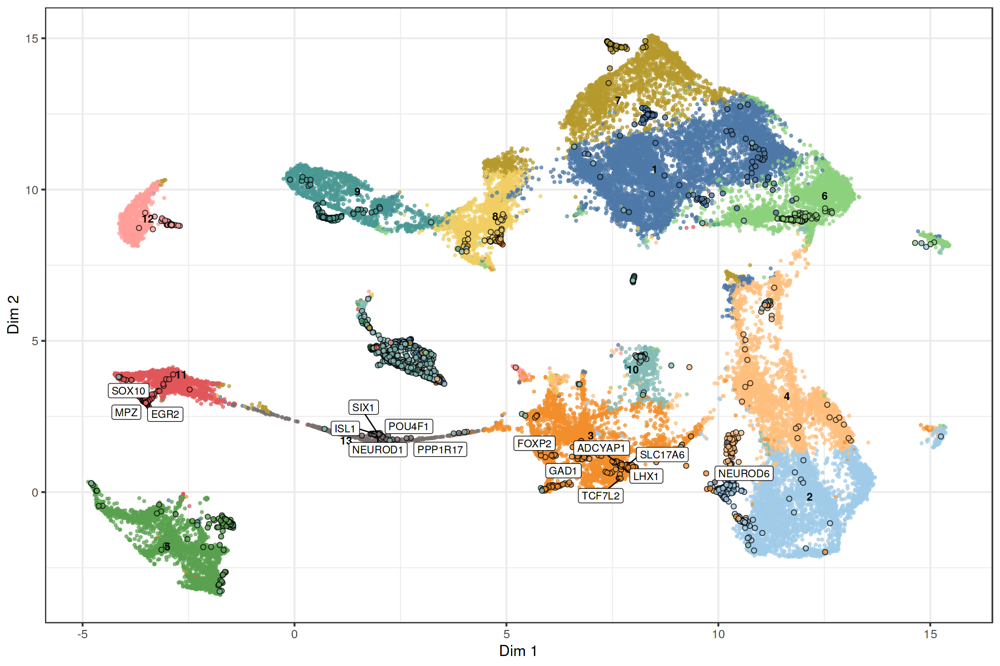

In [56]:

p <- plot_scatter_biMAP(cabic,
                        label_groups = TRUE, 
                        color_genes = TRUE) + 
    scale_color_manual(values = color_theme) +
    scale_fill_manual(values = color_theme) +
    theme_bw(base_size = 16) +
    theme(legend.position = "none") +
geom_label_repel(data = cabic@bimap[cabic@bimap$name %in% gois,],
                     aes(x, y, label=name),
                     color = "black",
                     max.overlaps = Inf) 

p

# ggsave(plot = p, 
#        filename = file.path(fig4_dir, "scatter_biMAP_clusters_fig4_panel_a.pdf"),
#        width = 2500,
#        height = 2300,
#        units = "px")

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



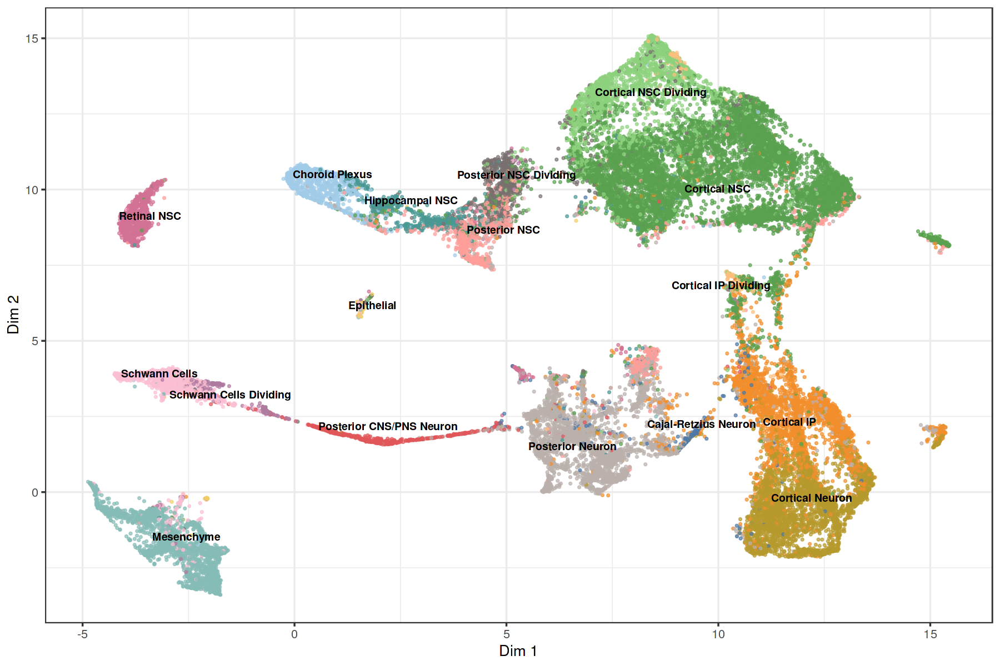

In [75]:
# not included in paper


pal <- tableau_color_pal("Tableau 20")
clusters <- unique(sce_sub$cell_type)
cols <- pal(length(clusters))
names(cols) <- as.character(sort(clusters))


p <- plot_scatter_biMAP(cabic, 
                        group_label_size = 4,
                        cell_size = 1, 
                        gene_alpha = 0,
                        label_groups = TRUE, 
                        color_genes = FALSE,
                        meta_df = colData(sce_sub), 
                        color_by = "cell_type") + 
    scale_color_manual(values = cols) +
    theme_bw(base_size = 16) +
    theme(legend.position = "none")

p

# ggsave(plot = p, 
#        filename = file.path(imgdir, "scatter_biMAP_scatter_celltype.pdf"),
#        width = 2500,
#        height = 2300,
#        units = "px")

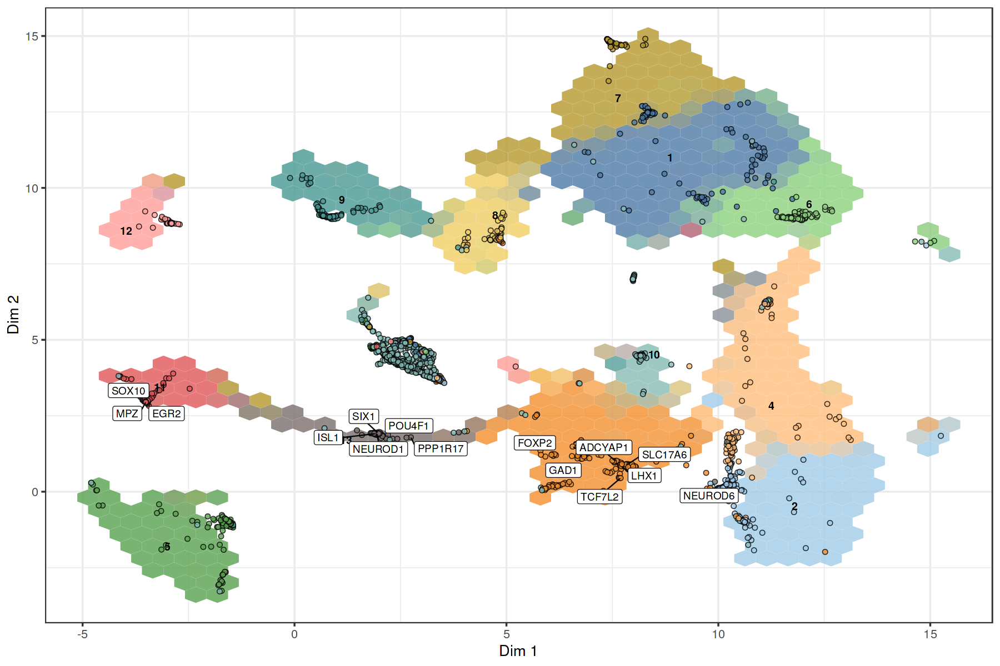

In [76]:
# not included in paper


clusters <- unique(c(cell_clusters(cabic), gene_clusters(cabic)))
cols <- pal(length(unique(clusters)))
names(cols) <- as.character(sort(clusters))

p <- plot_hex_biMAP(cabic,
                        label_groups = TRUE, 
                        color_genes = TRUE,
                        color_by = "cluster",
                        colors = cols) + 
    theme_bw(base_size = 16) +
    theme(legend.position = "none") +
geom_label_repel(data = cabic@bimap[cabic@bimap$name %in% gois,],
                     aes(x, y, label=name),
                     color = "black",
                     max.overlaps = Inf) 
p

# ggsave(plot = p, 
#        filename = file.path(imgdir, "hex_biMAP_clusters.pdf"),
#        width = 2500,
#        height = 2300,
#        units = "px")

## interactive biMAP

### interactive scatter plot

In [1]:

p <- plot_scatter_biMAP(cabic,
                        color_genes = TRUE) + 
    scale_color_manual(values = color_theme) +
    scale_fill_manual(values = color_theme) +
    theme_bw(base_size = 16)

interactive <- ggplotly(p)
interactive %>% layout(autosize = FALSE, width = 700, height = 500)

# htmlwidgets::saveWidget(interactive, file.path(imgdir, "interactive_bimap.html"))


ERROR: Error in plot_scatter_biMAP(cabic, color_genes = TRUE): could not find function "plot_scatter_biMAP"


### interactive hex plot

Warning message in geom2trace.default(dots[[1L]][[1L]], dots[[2L]][[1L]], dots[[3L]][[1L]]):
“geom_GeomTextRepel() has yet to be implemented in plotly.
  If you'd like to see this geom implemented,
  Please open an issue with your example code at
  https://github.com/ropensci/plotly/issues”
Warning message:
“Specifying width/height in layout() is now deprecated.
Please specify in ggplotly() or plot_ly()”


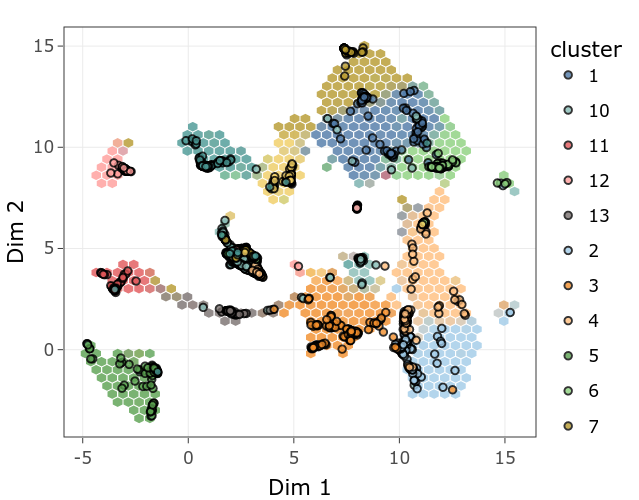

In [24]:

interactive <- plot_hex_biMAP(cabic,
                    color_genes = TRUE,
                    colors = color_theme,
                    interactive = TRUE)

interactive %>% layout(autosize = FALSE, width = 700, height = 500)

# htmlwidgets::saveWidget(interactive, file.path(imgdir, "interactive_hex_bimap.html"))



## trajectory feture plots - panel b

In [45]:
gois <- c("SOX9",
          "NEUROG2",
          "NEUROD2")

logcnts <- SummarizedExperiment::assay(sce_sub, "logcounts")

min_cutoff <- as.numeric(quantile(map_dbl(gois, function(x) min(logcnts[x,])), 0.1))
max_cutoff <- as.numeric(quantile(map_dbl(gois, function(x) max(logcnts[x,])), 0.9))
                                          

In [50]:
plots <- list()

for (gene in gois){
    
    p <- feature_biMAP(caclust = cabic,
                   sce = sce_sub, 
                   feature = gene,
                   assay = "logcounts",
                   label_size = 9) +
    viridis::scale_color_viridis(name="logcounts", 
                                 discrete = FALSE,
                                 limits = c(floor(min_cutoff), round(max_cutoff)),
                                 oob = scales::squish) +
    theme_bw(base_size = 18) +
        labs(x="", y = "") +
    theme(legend.position = "none", 
          panel.background = element_rect(fill='transparent'),
          plot.background = element_rect(fill='transparent', color=NA), 
          legend.background = element_rect(fill='transparent'),
          axis.text.x = element_blank(),
          axis.text.y = element_blank(),
          axis.line = element_line(colour = "black"),
          panel.border = element_rect(colour = "black"),
          plot.margin = unit(c(2,0,2,0), "mm")
         ) 
    

    plots[[gene]] <- p
    
}



Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



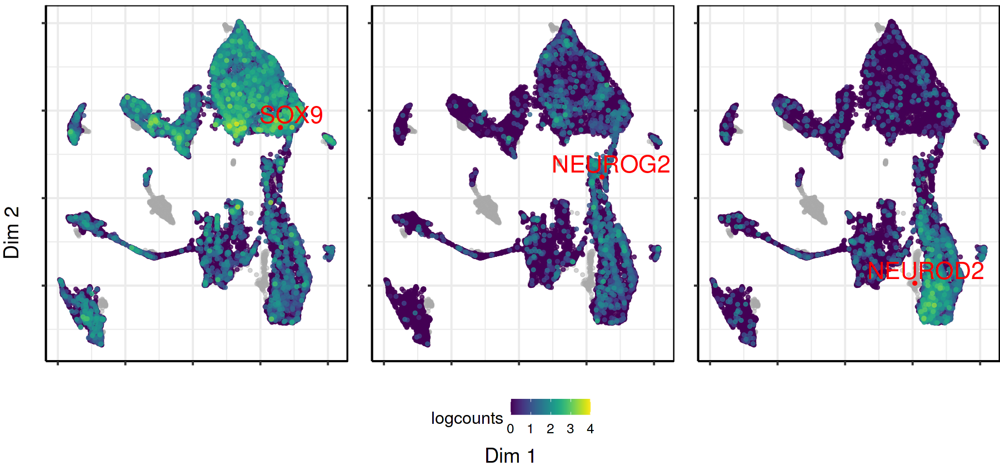

In [51]:

fig <- ggpubr::ggarrange(plotlist = plots, 
                  # labels = letters[1:length(plots)],
                  # font.label = list(size = 16, face = "bold"),
                  common.legend = TRUE,
                  legend = "bottom",
                         # align = "hv",
                  ncol = 3, nrow = 1)


fig <- ggpubr::annotate_figure(fig, 
                               left = textGrob("Dim 2", 
                                               rot = 90,
                                               vjust = 0.5, 
                                               gp = gpar(cex = 1.8)),
                               bottom = textGrob("Dim 1", 
                                                 gp = gpar(cex = 1.8)))

options(repr.plot.width = 15, repr.plot.height = 7)
fig
options(repr.plot.width = 15, repr.plot.height = 10)


# ggsave(plot = fig, 
#        filename = file.path(imgdir, paste0("tajectory_fig4_panel_b.png")),
#        width = 1200*3,
#        height = 1500,
#        units = "px")


## Sankey plot - panel d

Warning message:
“attributes are not identical across measure variables;
they will be dropped”
`summarise()` has grouped output by 'Biclusters'. You can override using the `.groups` argument.


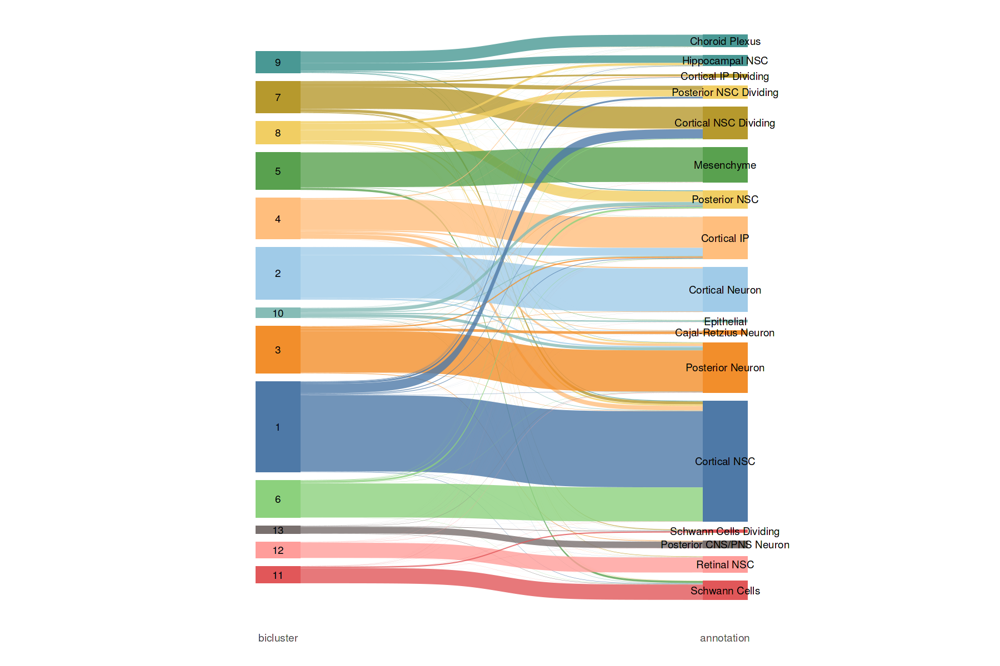

In [74]:
data <- colData(sce_sub) %>%
        as.data.frame() %>%
        rename('annotation' = "cell_type",
               'bicluster' = "cabinet_cluster")



df <- data %>% 
    make_long(bicluster, annotation)

info  <-  data.frame(Biclusters = as.factor(data$bicluster),
                     Truth = as.character(data$annotation)) %>%  
                as_tibble() %>%
                group_by(Biclusters, Truth) %>% 
                summarise(n = n()) %>%
                group_by(Truth) %>% 
                mutate(Partition = n/sum(n)) %>%
                ungroup() %>% 
                as.data.frame() %>% 
                group_by(Truth) %>%
                filter(Partition == max(Partition) ) %>%
                dplyr::select(Biclusters, Truth) %>%
                distinct(Biclusters, .keep_all = TRUE)

cts <- unique(data$bicluster)

cols <- color_theme

info <- left_join(data.frame("Biclusters" = names(cols), "col" = cols), info, by = "Biclusters")


cols <- c(cols, info$col)
names(cols) <- c(names(color_theme), info$Truth)


order <- c("11",
           "12",
           "13",
           "6",
           "1",
           "3",
           "10",
           "2",
           "4",
           "5",
           "8",
           "7",
           "9",
           "Schwann Cells",
           "Retinal NSC",
           "Posterior CNS/PNS Neuron",
           "Schwann Cells Dividing",
           "Cortical NSC",
           "Posterior Neuron",
           "Cajal-Retzius Neuron",
           "Epithelial",
           "Cortical Neuron",
           "Cortical IP",
           "Posterior NSC",
           "Mesenchyme",
           "Cortical NSC Dividing",
           "Posterior NSC Dividing",
           "Cortical IP Dividing",
           "Hippocampal NSC",
           "Choroid Plexus")


df$node <- factor(df$node, levels = order)
df$next_node <- factor(df$next_node, levels = order)
df <- df[!is.na(df$node),]

sank <- ggplot(df, aes(x = x, 
               next_x = next_x, 
               node = node, 
               next_node = next_node,
               fill = node,
               label = as.character(node))) +
  geom_sankey(flow.alpha = 0.8) +
  geom_sankey_text() +
  labs(x = "") +
  scale_fill_manual(values = cols) +
  theme_sankey(base_size = 14) +
  theme(legend.position = "none")

sank


# ggsave(plot = sank, 
#        filename = file.path(fig4_dir, "sankey_plot_fig4_panel_d.pdf"),
#        width = 3000,
#        height = 2500,
#        units = "px")

## heatmap - panel c

In [31]:
# The scoring of genes can take a long time!

mono_cabic <- cabic
clusters <- sort(unique(cell_clusters(mono_cabic)))
gc_names <- names(gene_clusters(mono_cabic))

clust_dir <- file.path(imgdir, "clusters")

scored_genes <- list()

apl_list <- list()


for (i in seq_along(clusters)){

    gc_clust <- gc_names[gene_clusters(mono_cabic) == clusters[i]]
    ca <- apl_coords(ca, group = which(as.numeric(sce_sub$cabinet_cluster) == clusters[i]))
    ca <- apl_score(ca, 
                    mat = as.matrix(logcounts(sce_sub)), 
                    dims = ca@dims,
                    method = "permutation")

    cluster <- paste0("cluster_", clusters[i])

    scored_genes[[cluster]] <- arrange(ca@APL_score[gc_clust,], Rank)

    eg = clusterProfiler::bitr(scored_genes[[cluster]]$Rowname,
                               fromType="SYMBOL",
                               toType="ENTREZID",
                               OrgDb="org.Hs.eg.db")

    gene_summary <- mygene::getGenes(eg$ENTREZID, fields = "all")

    gene_summary <- gene_summary %>% 
                    as.data.frame() %>% 
                    dplyr::select(symbol, name, summary)

    scored_genes[[cluster]][gene_summary$symbol, "name"] <- gene_summary$name 

    scored_genes[[cluster]][gene_summary$symbol, "summary"] <- gene_summary$summary

    write_csv(scored_genes[[cluster]], paste0(imgdir, "/", cluster, "_scored_genes.csv"))    
    

    top5 <- arrange(ca@APL_score[gc_clust,], Rank)$Rowname[1:5]


    p <- apl(caobj = ca,
            rows_idx = gc_clust,
            row_labs = FALSE) +
    ggrepel::geom_label_repel(data = data.frame(ca@apl_rows[top5,], "name" = top5),
                             aes(x, y, label=top5),                    
                             color = "red",
                             max.overlaps = Inf)+ 
                                ggtitle(cluster)
    
    apl_list[[cluster]] <- p

    # ggsave(plot = p, 
    #        filename = paste0(clust_dir, "/", cluster, "_apl.png"))

    for (g in seq_len(length(top5))){
        p <- plot_feature_biMAP(sce = sce_sub,
                                caclust = cabic,
                                feature = top5[g],
                                assay = "logcounts",
                                color_cells_by = "expression",)


        # ggsave(plot = p, 
        #        filename = file.path(clust_dir,
        #                             paste0(cluster, "_feature_biUMAP_", top5[g],".png")))

    }
    
}

# saveRDS(scored_genes, file.path(clust_dir, "scored_genes.rds"))

  |======================================================================| 100%


'select()' returned 1:1 mapping between keys and columns

Warning message in clusterProfiler::bitr(scored_genes[[cluster]]$Rowname, fromType = "SYMBOL", :
“7.41% of input gene IDs are fail to map...”
Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



  |======================================================================| 100%


'select()' returned 1:1 mapping between keys and columns

Warning message in clusterProfiler::bitr(scored_genes[[cluster]]$Rowname, fromType = "SYMBOL", :
“1.44% of input gene IDs are fail to map...”
Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



  |======================================================================| 100%


'select()' returned 1:1 mapping between keys and columns

Warning message in clusterProfiler::bitr(scored_genes[[cluster]]$Rowname, fromType = "SYMBOL", :
“4.03% of input gene IDs are fail to map...”
Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



  |======================================================================| 100%


'select()' returned 1:1 mapping between keys and columns

Warning message in clusterProfiler::bitr(scored_genes[[cluster]]$Rowname, fromType = "SYMBOL", :
“5.65% of input gene IDs are fail to map...”
Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



  |======================================================================| 100%


'select()' returned 1:1 mapping between keys and columns

Warning message in clusterProfiler::bitr(scored_genes[[cluster]]$Rowname, fromType = "SYMBOL", :
“1.63% of input gene IDs are fail to map...”
Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



  |======================================================================| 100%


'select()' returned 1:1 mapping between keys and columns

Warning message in clusterProfiler::bitr(scored_genes[[cluster]]$Rowname, fromType = "SYMBOL", :
“3.16% of input gene IDs are fail to map...”
Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



  |======================================================================| 100%


'select()' returned 1:1 mapping between keys and columns

Warning message in clusterProfiler::bitr(scored_genes[[cluster]]$Rowname, fromType = "SYMBOL", :
“2.67% of input gene IDs are fail to map...”
Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



  |======================================================================| 100%


'select()' returned 1:1 mapping between keys and columns

Warning message in clusterProfiler::bitr(scored_genes[[cluster]]$Rowname, fromType = "SYMBOL", :
“4.65% of input gene IDs are fail to map...”
Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



  |======================================================================| 100%


'select()' returned 1:1 mapping between keys and columns

Warning message in clusterProfiler::bitr(scored_genes[[cluster]]$Rowname, fromType = "SYMBOL", :
“4.9% of input gene IDs are fail to map...”
Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



  |======================================================================| 100%


'select()' returned 1:1 mapping between keys and columns

Warning message in clusterProfiler::bitr(scored_genes[[cluster]]$Rowname, fromType = "SYMBOL", :
“8.83% of input gene IDs are fail to map...”
Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



  |======================================================================| 100%


'select()' returned 1:1 mapping between keys and columns

Warning message in clusterProfiler::bitr(scored_genes[[cluster]]$Rowname, fromType = "SYMBOL", :
“2.35% of input gene IDs are fail to map...”
Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



  |======================================================================| 100%


'select()' returned 1:1 mapping between keys and columns

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



  |======================================================================| 100%


'select()' returned 1:1 mapping between keys and columns

Warning message in clusterProfiler::bitr(scored_genes[[cluster]]$Rowname, fromType = "SYMBOL", :
“1.89% of input gene IDs are fail to map...”
Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



png 
  2

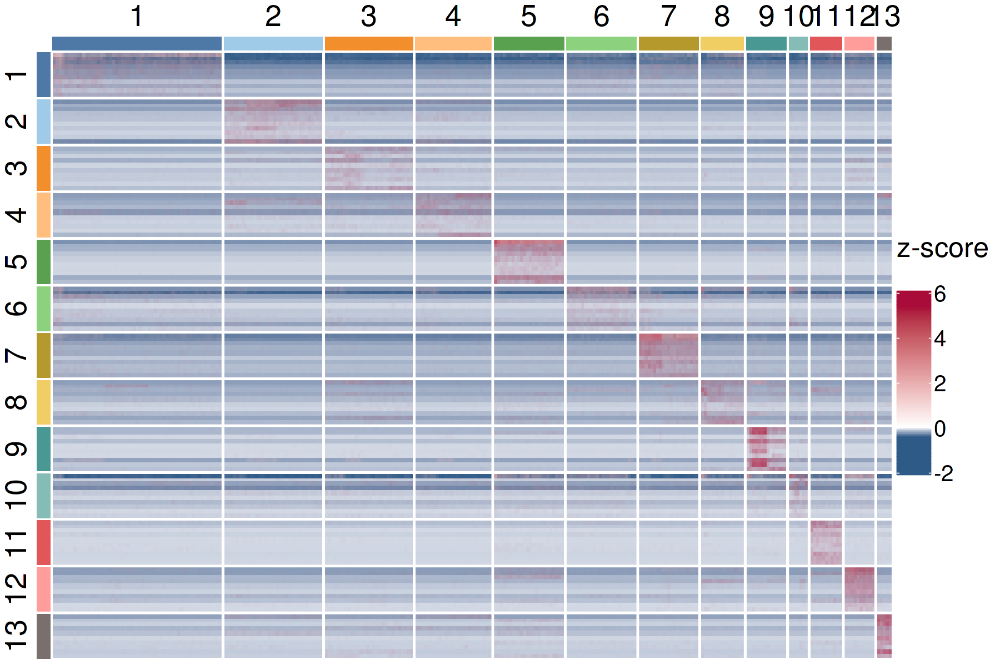

In [32]:
top_genes <- unique(unlist(purrr::map(1:length(scored_genes), function(x) head(scored_genes[[x]]$Rowname, 10))))

mono_cabic <- cabic

mat <- as.matrix(logcounts(sce_sub[names(gene_clusters(mono_cabic)),names(cell_clusters(mono_cabic))]))

mat  <- (mat - rowMeans(mat))/rowSds(mat)
mat[is.na(mat)] <- 0

clust_order_cells <- c()
un_cc <- sort(unique(cell_clusters(mono_cabic)))
for (i in seq_along(un_cc)){
    clust_order_cells <- c(clust_order_cells, which(cell_clusters(mono_cabic) == un_cc[i]))
}
                           
clust_order_genes <- c()
un_gc <- sort(unique(gene_clusters(mono_cabic)))
for (i in seq_along(un_gc)){
    clust_order_genes <- c(clust_order_genes, which(gene_clusters(mono_cabic) == un_gc[i]))
}                           

mat <- mat[clust_order_genes, clust_order_cells]
mat <- mat[which(rownames(mat) %in% top_genes),]

ccs <- cell_clusters(mono_cabic)[colnames(mat)]
gcs <- gene_clusters(mono_cabic)[rownames(mat)]

data(palette36)
names(palette36) <- NULL

col_fun = colorRamp2(c(quantile(mat,0.01), 0, quantile(mat,0.99)), c("#2E5A87", "white", "#A90C38"))

pal <- tableau_color_pal("Tableau 20")
annocol <- pal(length(un_cc))

names(annocol) <- as.character(un_cc)

column_ha = HeatmapAnnotation(cluster = ccs, 
                              col = list(cluster = annocol), 
                              annotation_name_gp= gpar(fontsize = 0), 
                              show_legend = c(FALSE))

row_ha = rowAnnotation(cluster =  gcs,
                       col = list(cluster = annocol),
                       show_legend = c(FALSE),
                       annotation_name_gp= gpar(fontsize = 0))

hm <- Heatmap(mat,
        name = "z-score",
        heatmap_legend_param = list(col_fun = col_fun, 
                                     title = "z-score\n",
                                     grid_width = unit(1.3, "cm"),
                                     legend_height = unit(7, "cm"),
                                     title_gp = gpar(fontsize = 30),
                                     labels_gp = gpar(fontsize = 24)),
        cluster_rows = FALSE,
        cluster_columns = FALSE,
        show_column_names = FALSE,
        cluster_row_slices = FALSE,
        cluster_column_slices = FALSE,
        show_row_names = FALSE,
        row_title_side = "left",
        col = col_fun,
        top_annotation = column_ha,
        left_annotation = row_ha,
        use_raster = TRUE,
    	row_split = gcs,
        column_split = ccs,
        column_title_gp = gpar(fontsize = 32),
        row_title_gp = gpar(fontsize = 32))


hm
                                      
# png(file = paste0(fig4_dir, "/heatmap_top10_scored_genes_fig4_panel_c.png"),
#     width = 2100,
#     height = 1400,
#     unit = "px")
# hm
# dev.off()

# Supplementary Figure 9

## Feature biMAPs

In [52]:

gois <- c("NEUROD6",
          "TCF7L2",
          "FOXP2",
          "LHX1",
          "GAD1",
          "ADCYAP1",
          "SLC17A6",
          "MPZ",
          "EGR2",
          "SOX10",
          "NEUROD1",
          "PPP1R17",
          "ISL1",
          "POU4F1",
          "SIX1")


logcnts <- SummarizedExperiment::assay(sce_sub, "logcounts")

min_cutoff <- as.numeric(quantile(map_dbl(gois, function(x) min(logcnts[x,])), 0.1))
max_cutoff <- as.numeric(quantile(map_dbl(gois, function(x) max(logcnts[x,])), 0.9))
                                          

In [53]:

feature_dir <- file.path(imgdir, "paper_gois")
dir.create(feature_dir)
plots <- list()

for (gene in gois){
    
    p <- feature_biMAP(caclust = cabic,
                   sce = sce_sub, 
                   feature = gene,
                   assay = "logcounts",
                   label_size = 6) +
    viridis::scale_color_viridis(name="logcounts", 
                                 discrete = FALSE,
                                 limits =c(floor(min_cutoff), round(max_cutoff)),
                                 oob=scales::squish) +
    theme_bw(base_size = 16) +
        labs(x="", y = "") +
    theme(legend.position = c(0.9, 0.2),     
          panel.background = element_rect(fill='transparent'), #transparent panel bg
          plot.background = element_rect(fill='transparent', color=NA), #transparent plot bg
          legend.background = element_rect(fill='transparent'), #transparent legend bg
          axis.text.x = element_blank(),
          axis.text.y = element_blank(),
          axis.line = element_line(colour = "black"),
          panel.border = element_rect(colour = "black"),
          plot.margin = unit(c(2,6,2,2), "mm")
         )
    

    plots[[gene]] <- p
    
    
   # ggsave(plot = p, 
   #     filename = file.path(feature_dir, paste0("feature_biMAP_", gene, ".png")),
   #     width = 2500,
   #     height = 2300,
   #     units = "px")
    
}


Warning message in dir.create(feature_dir):
“'./brain_organoids/res/img/paper_gois' already exists”
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the exist

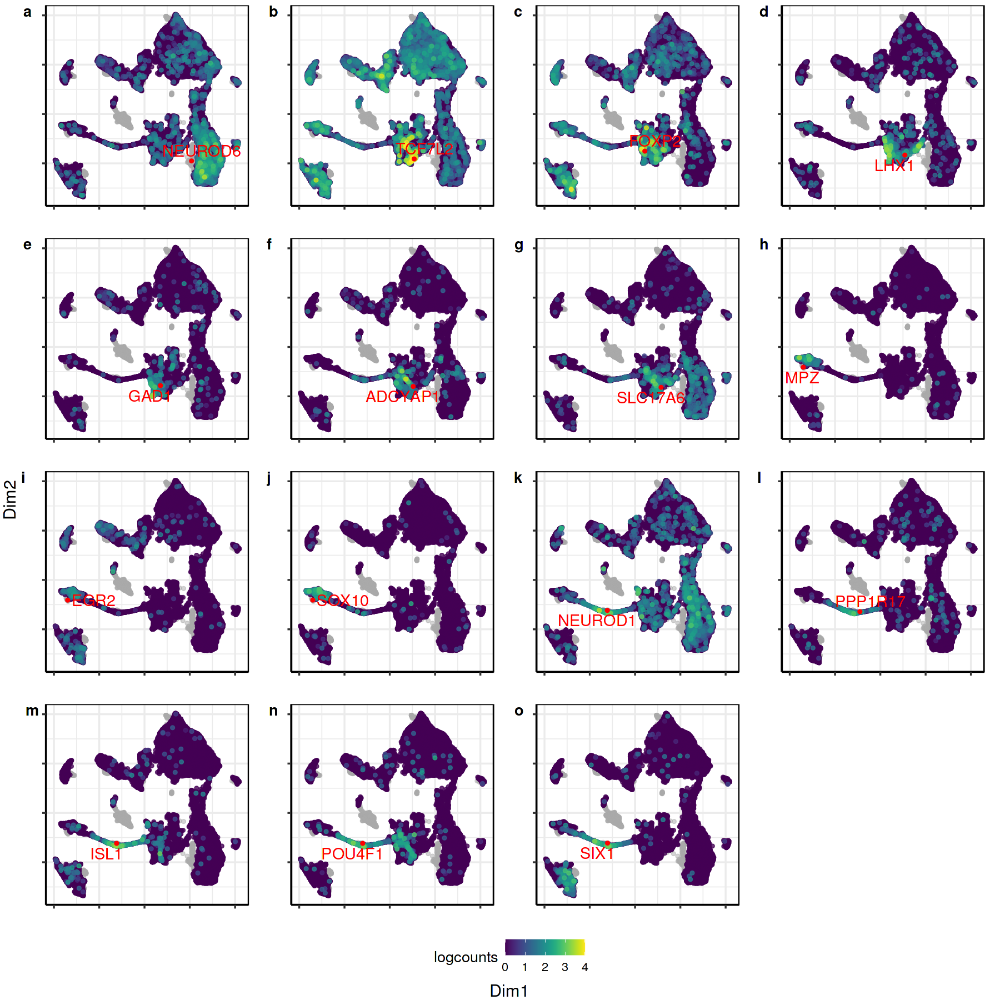

In [58]:
fig <- ggpubr::ggarrange(plotlist = plots, 
                  labels = letters[1:length(plots)],
                  font.label = list(size = 16, face = "bold"),
                  common.legend = TRUE,
                  legend = "bottom",
                         # align = "hv",
                  ncol = 4, nrow = 4)


fig <- ggpubr::annotate_figure(fig, 
                               left = textGrob("Dim2", rot = 90, vjust = 0.5, gp = gpar(cex = 1.5)),
                               bottom = textGrob("Dim1", gp = gpar(cex = 1.5)))


options(repr.plot.width = 15, repr.plot.height = 15)

fig

options(repr.plot.width = 15, repr.plot.height = 10)


# ggsave(plot = fig, 
#        filename = file.path(sfig9_dir, paste0("feature_panel_sfig9.png")),
#        width = 1000*4,
#        height = 1000*4,
#        units = "px")

# Supplementary Figure 10

## Cell cycle scores

In [36]:
hs.pairs <- readRDS(system.file("exdata", 
                                "human_cycle_markers.rds", 
                                package="scran"))

symbols <- mapIds(org.Hs.eg.db, 
                  keys = rownames(sce_sub), 
                  keytype = "SYMBOL", 
                  column="ENSEMBL")

assignments <- cyclone(sce_sub, 
                       hs.pairs, 
                       gene.names=symbols[rownames(sce_sub)])


sce_sub$cycle <- assignments$phases

colData(sce_sub) <- cbind(colData(sce_sub), assignments$normalized.scores)


Loading required package: AnnotationDbi


Attaching package: ‘AnnotationDbi’


The following object is masked from ‘package:plotly’:

    select


The following object is masked from ‘package:dplyr’:

    select


'select()' returned 1:many mapping between keys and columns



Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Warning message:
“Removed 1 rows containing missing values (geom_text_repel).”


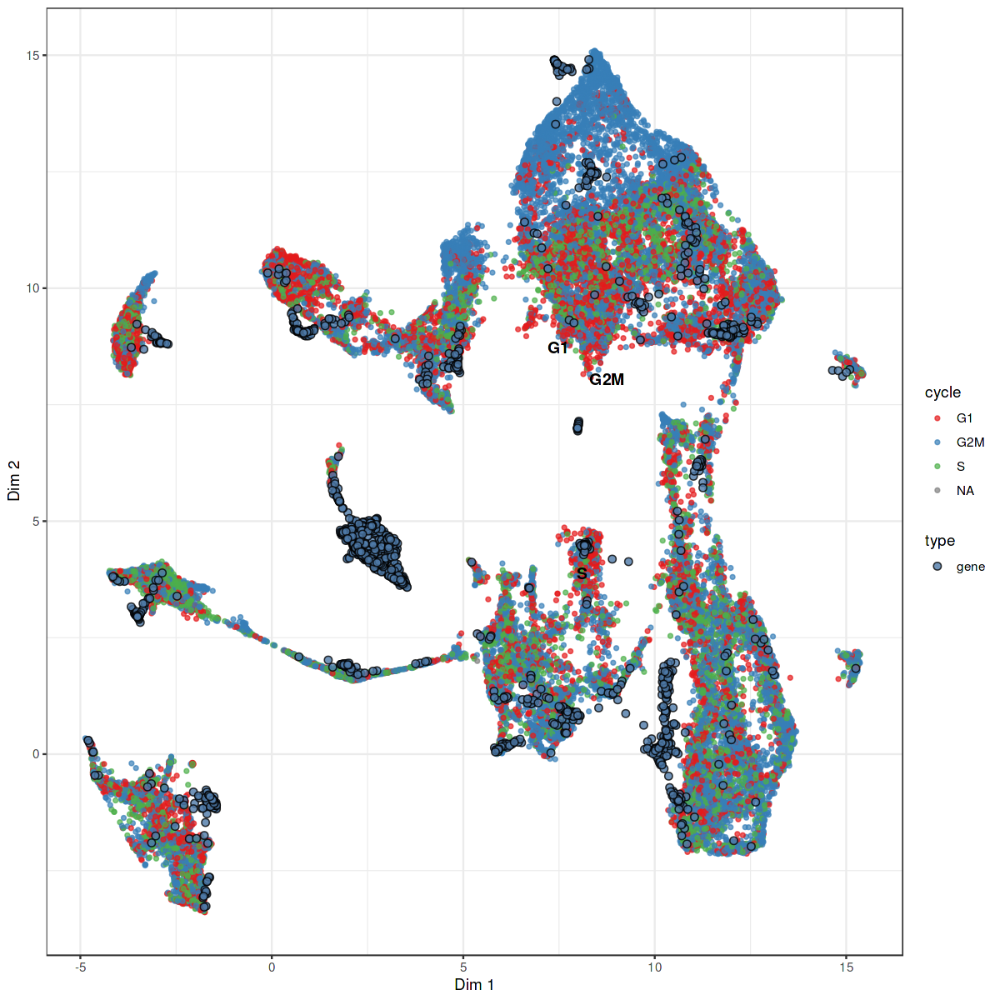

In [ ]:

set_breaks = function(limits) {
     seq(limits[1], limits[2], by = 1)
}


p1 <- plot_scatter_biMAP(cabic,
                   color_by = "cycle",
                   color_genes = F,
                   meta_df = colData(sce_sub),
                ) + 
            scale_fill_tableau()

# this plot is not included in the paper
p1

p2 <- plot_metadata_biMAP(cabic, color_cells_by = "G1", meta_df = colData(sce_sub)) +
    viridis::scale_color_viridis(name="score", discrete = FALSE, breaks = set_breaks, limits = c(0,1)) +
    theme_bw(base_size = 12) +
        labs(title = "G1 phase score", x="", y = "") +
    theme( legend.position = "bottom",
          panel.background = element_rect(fill='transparent'),
          plot.background = element_rect(fill='transparent', color=NA),
          legend.background = element_rect(fill='transparent'),
          axis.text.x = element_blank(),
          axis.text.y = element_blank(),
          axis.line = element_line(colour = "black"),
          panel.border = element_rect(colour = "black"),
          plot.margin = unit(c(2,6,2,2), "mm")
         )

# p2


p3 <- plot_metadata_biMAP(cabic, color_cells_by = "S", meta_df = colData(sce_sub))+
    viridis::scale_color_viridis(name="score", discrete = FALSE, breaks = set_breaks, limits = c(0,1)) +
    theme_bw(base_size = 12) +
        labs(title = "S phase score", x="", y = "") +
    theme( legend.position = "bottom",
          panel.background = element_rect(fill='transparent'), 
          plot.background = element_rect(fill='transparent', color=NA),
          legend.background = element_rect(fill='transparent'), 
          axis.text.x = element_blank(),
          axis.text.y = element_blank(),
          axis.line = element_line(colour = "black"),
          panel.border = element_rect(colour = "black"),
          plot.margin = unit(c(2,6,2,2), "mm")
         )

# p3

p4 <- plot_metadata_biMAP(cabic, color_cells_by = "G2M", meta_df = colData(sce_sub)) +
    viridis::scale_color_viridis(name="score", discrete = FALSE, breaks = set_breaks, limits = c(0,1)) +
    theme_bw(base_size = 12) +
        labs(title = "G2M score",x="", y = "") +
    theme( legend.position = "bottom",
          panel.background = element_rect(fill='transparent'),
          plot.background = element_rect(fill='transparent', color=NA),
          legend.background = element_rect(fill='transparent'),
          axis.text.x = element_blank(),
          axis.text.y = element_blank(),
          axis.line = element_line(colour = "black"),
          panel.border = element_rect(colour = "black"),
          plot.margin = unit(c(2,6,2,2), "mm")
         )

# p4

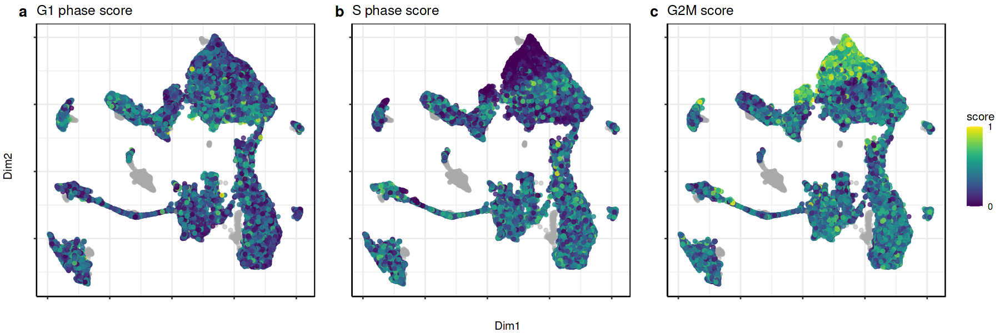

In [41]:

fig <- ggpubr::ggarrange(plotlist = list(p2,p3,p4), 
                  labels = letters[1:length(plots)],
                  font.label = list(size = 16, face = "bold"),
                  common.legend = TRUE,
                  legend = "right",
                  ncol = 3, nrow = 1)


fig <- ggpubr::annotate_figure(fig, 
                               left = textGrob("Dim2", rot = 90, vjust = 0.5, gp = gpar(cex = 1)),
                               bottom = textGrob("Dim1", gp = gpar(cex = 1)))

options(repr.plot.width = 15, repr.plot.height = 5)
fig
options(repr.plot.width = 15, repr.plot.height = 10)


# ggsave(plot = fig, 
#        filename = file.path(sfig10_dir, paste0("cell_cycle_sfig10.png")),
#        width = 1200 *3,
#        height = 1200,
#        units = "px")


# R environment

In [80]:
sessionInfo()

R version 4.2.1 (2022-06-23)
Platform: x86_64-pc-linux-gnu (64-bit)
Running under: MarIuX64 2.0 GNU/Linux

Matrix products: default
BLAS:   /pkg/R-4.2.1-0/lib/R/lib/libRblas.so
LAPACK: /pkg/R-4.2.1-0/lib/R/lib/libRlapack.so

locale:
 [1] LC_CTYPE=en_US.UTF-8 LC_NUMERIC=C         LC_TIME=C           
 [4] LC_COLLATE=C         LC_MONETARY=C        LC_MESSAGES=C       
 [7] LC_PAPER=C           LC_NAME=C            LC_ADDRESS=C        
[10] LC_TELEPHONE=C       LC_MEASUREMENT=C     LC_IDENTIFICATION=C 

attached base packages:
[1] grid      stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] org.Hs.eg.db_3.15.0         AnnotationDbi_1.58.0       
 [3] ComplexHeatmap_2.12.0       ggsankey_0.0.99999         
 [5] htmlwidgets_1.5.4           circlize_0.4.15            
 [7] Polychrome_1.5.1            ggthemes_4.2.4             
 [9] ggrepel_0.9.1               plotly_4.10.0              
[11] forcats_0.5.1               stringr_